# **WW2 Image Captioning Task**

#### **Libraries Import**

In [1]:
pip install googletrans==4.0.0-rc1

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.1/55.1 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 31.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.4/133.4 kB 17.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.6/53.6 kB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.0/65.0 kB 8.6 MB/s eta 0:00:00
  Created wheel for googletrans: filename=googletrans-4.0.0rc1-py3-none-any.whl size=17397 sha256=e26a976817920c10f660874360b1ff8a1d7fafffddae1a103c7148e1e0a09f44
  Stored in directory: /root/.cache/pip/wheels/c0/59/9f/7372f0cf70160fe61b528532e1a7c8498c4becd6bcffb022de
Successfully built googletrans
  Attempting uninstall: chardet
    Found existing installation: chardet 4.0.0
    Uninstalling ch

In [2]:
import tensorflow as tf
import json
import re
import random
from math import sqrt
import collections
from tqdm.auto import tqdm



from __future__ import print_function, division

# Importing basics:
import numpy as np
import h5py
import matplotlib.pyplot as plt
import pandas as pd

# For image pre/processing:
from PIL import Image
#from skimage.io import imread
from skimage.transform import resize
from skimage import io, transform

# Retrieve and manipulate paths:
import urllib
import requests
import os
import shutil
import pickle


# Performance metrics and train test split:
from sklearn.model_selection import train_test_split

# Useful
from tqdm import tqdm
import time
import copy

# PyTorch's:
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils, datasets, models
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import torchvision
import torch.nn.functional as F
from torch.autograd import Variable

# To access Google Drive:
from google.colab import drive


# interactive mode
plt.ion()

# For translation model evaluation

from nltk.translate.bleu_score import sentence_bleu
#from nltk.translate.meteor_score import meteor_score


# Ignore warnings
import warnings
warnings.filterwarnings("ignore")

# PyTorch's versions:
print("PyTorch Version: ",torch.__version__)
print("Torchvision Version: ",torchvision.__version__)
print("NumPy Version: ",np.__version__)
drive.mount("/content/gdrive")


PyTorch Version:  2.0.1+cu118
Torchvision Version:  0.15.2+cu118
NumPy Version:  1.22.4
Mounted at /content/gdrive


#### **Loading Data From Drive**

In [3]:
data_path = '/content/gdrive/MyDrive/metadati_tags_vitullo - metadati_tags_agi_2.xlsx'

data = pd.read_excel(data_path)
print(data.shape)
print(data.head())

(452, 3)
   media id      tags                                          media url
0         8    Calcio  https://agi.caveaudigitale.com/Archivio%20Vitu...
1        29  Ritratti  https://agi.caveaudigitale.com/Archivio%20Vitu...
2       129    Calcio  https://agi.caveaudigitale.com/Archivio%20Vitu...
3       265  Ritratti  https://agi.caveaudigitale.com/Archivio%20Vitu...
4       468  Ritratti  https://agi.caveaudigitale.com/Archivio%20Vitu...


#### **Translating Labels into English**

Here to translate the tags we uses the googletrans library to create a function that takes italian text and returns its english translation.

these translated tags are saves in the new column named as eng_tags. which we will use the in our image captioning task.

In [4]:
from googletrans import Translator

def translate_italian_to_english(text):
    translator = Translator()
    translation = translator.translate(text, src='it', dest='en')
    translated_text = translation.text
    return translated_text

In [5]:
data['eng_tags'] = data['tags'].apply(translate_italian_to_english)

In [6]:
data.head()

,media id,tags,media url,eng_tags
0,8,Calcio,https://agi.caveaudigitale.com/Archivio%20Vitu...,Soccer
1,29,Ritratti,https://agi.caveaudigitale.com/Archivio%20Vitu...,Portraits
2,129,Calcio,https://agi.caveaudigitale.com/Archivio%20Vitu...,Soccer
3,265,Ritratti,https://agi.caveaudigitale.com/Archivio%20Vitu...,Portraits
4,468,Ritratti,https://agi.caveaudigitale.com/Archivio%20Vitu...,Portraits


#### **Cleaning Dataframe**

Here we change the column name for the ease. then check the total number of unique values in each column to see whether we have repeated media_id or not. here we can see that the unique media_id are 452 which the total number of rows, this indicate that we have no repeated media. then we check for null values. which indicate that there is no null value in the dataset.

In [7]:
data.rename(columns={'media id':'media_id','media url':'media_url'},inplace = True)

In [8]:
data.nunique()

media_id     452
tags          31
media_url    452
eng_tags      31
dtype: int64

In [9]:
data.isnull().sum()

media_id     0
tags         0
media_url    0
eng_tags     0
dtype: int64

#### **Preprocessing captions**

As we have clean the dataframe above, now we need to clean/preprocess the captions of each image. Here a function is created named as preprocess, which first convert the text into lower case, then remove all of the non-alphanumeric values. replace the multiple white space which single white space. trim the text and then add the start and end at the start and end of the text (preparing data according to the language model requirments).

In [10]:
def preprocess(text):
    text = text.lower()
    text = re.sub(r'[^\w\s]', '', text)
    text = re.sub('\s+', ' ', text)
    text = text.strip()
    text = '[start] ' + text + ' [end]'
    return text

In [11]:
data['eng_tags'] = data['eng_tags'].apply(preprocess)
data.head()

,media_id,tags,media_url,eng_tags
0,8,Calcio,https://agi.caveaudigitale.com/Archivio%20Vitu...,[start] soccer [end]
1,29,Ritratti,https://agi.caveaudigitale.com/Archivio%20Vitu...,[start] portraits [end]
2,129,Calcio,https://agi.caveaudigitale.com/Archivio%20Vitu...,[start] soccer [end]
3,265,Ritratti,https://agi.caveaudigitale.com/Archivio%20Vitu...,[start] portraits [end]
4,468,Ritratti,https://agi.caveaudigitale.com/Archivio%20Vitu...,[start] portraits [end]


#### **Sample of image and its caption**
printing random sample of image along with its caption

In [12]:
from io import BytesIO

[start] state visits [end]



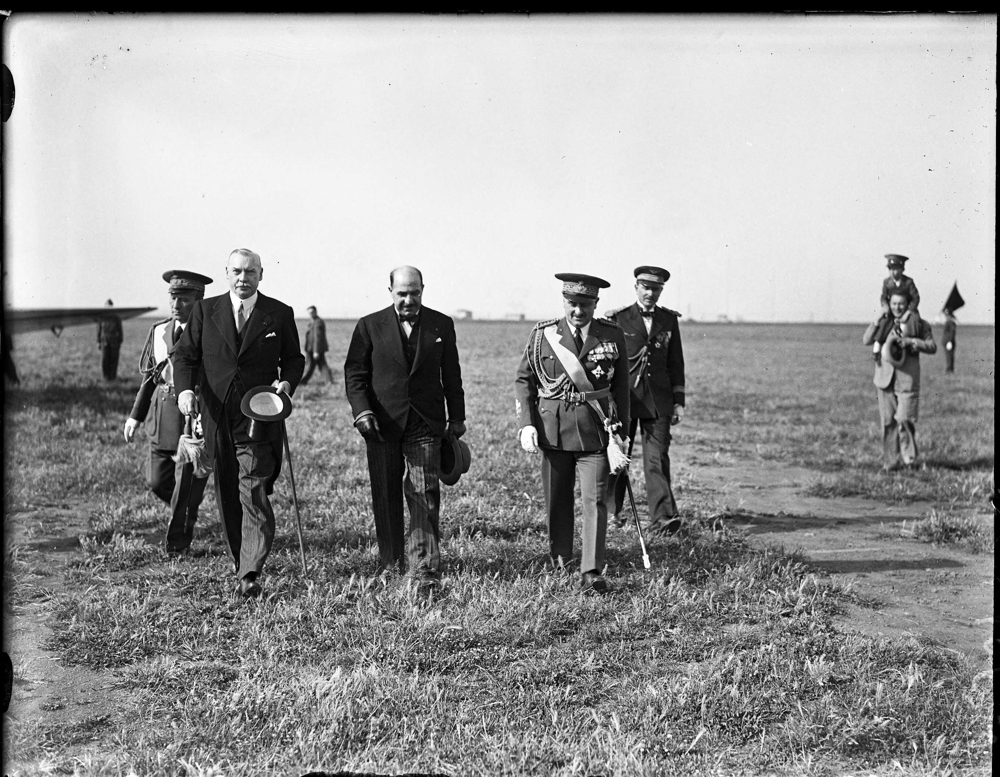

In [13]:
random_row = data.sample(1).iloc[0]
print(random_row.eng_tags)
print()
response = requests.get(random_row.media_url)
img = Image.open(BytesIO(response.content))
img

#### **Preprocessing Media_urls**
Now we will preprocess the media_urls by removing all of the urls that are invalid and doesnot work. for this urllib.request library is used to open the image and reading the images from it. then each image is encode in base64 then decode the base64 image. if any url failed to do these operations it will be marked as error_url. and will be removed from the dataset


In [14]:
import urllib.request
import base64

error_url = []
# Iterate over the image URLs and check for decoding issues
for url in data['media_url']:
    try:
        # Open the URL and read the image data
        web_browser = urllib.request.urlopen(url)
        image_data = web_browser.read()

        # Encode the image data in base64
        base64_image = base64.b64encode(image_data).decode('utf-8')

        # Decode the base64-encoded image
        decoded_image = base64.b64decode(base64_image)


    except Exception as e:
        # Print the URL and the corresponding error for troubleshooting
        print(f"Error processing image URL: {url}")
        print(f"Error message: {str(e)}")
        error_url.append(url)

        # Continue to the next image URL
        continue




Error processing image URL: https://agi.caveaudigitale.com/Archivio%20Vitullo/ARCHIVIO%20FOTOGRAFICO/File%20A1/A1_4001-5000
Error message: HTTP Error 404: Not Found


In [15]:
data = data[~data['media_url'].isin(error_url)]

Now basic processing is done by removing whitespaces. then validator library is use to further validate the urls

In [16]:
data['media_url'] = data['media_url'].str.strip()

In [17]:
pip install validators

  Preparing metadata (setup.py) ... done
  Created wheel for validators: filename=validators-0.20.0-py3-none-any.whl size=19579 sha256=a5ef544b6d5f3aba7bb55c79d75f9c7ff1bb25abfe717e63e4259185ec68a1f4
  Stored in directory: /root/.cache/pip/wheels/f2/ed/dd/d3a556ad245ef9dc570c6bcd2f22886d17b0b408dd3bbb9ac3
Successfully built validators


In [18]:
import validators
valid_url = []
for url in data['media_url']:
  if validators.url(url):
    valid_url.append(url)
  else:
    print("wrong url ", url)

#### **Tokenize Captions**

This code prepares the text data for input into a deep learning model by tokenizing it, converting it into numerical indices, and creating mappings between words and indices. These mappings are essential for building a language model, such as an image captioning model, where text data needs to be represented numerically for processing.

- tokenizer: This is an instance of the TextVectorization layer. It will be used to tokenize the text data and convert it into sequences of integers.

- tokenizer.adapt(data['eng_tags']): This fits the tokenizer on the text data data['eng_tags'] to build the vocabulary. The tokenizer learns the mapping between words and integer indices.


- pickle.dump(tokenizer.get_vocabulary(), open('vocab_coco.file', 'wb')): This saves the vocabulary of the tokenizer to a file named "vocab_coco.file" using pickle. This file can be used later for inference to restore the vocabulary.

- word2idx: This is an instance of the StringLookup layer. It creates a mapping from words to their corresponding integer indices using the vocabulary learned by the tokenizer.

- idx2word: This is another instance of the StringLookup layer. It creates a mapping from integer indices to their corresponding words using the vocabulary learned by the tokenizer. The invert=True argument indicates that this mapping should be from indices to words.










In [19]:
MAX_LENGTH = 40
VOCABULARY_SIZE = 15000
BATCH_SIZE = 64
BUFFER_SIZE = 1000
EMBEDDING_DIM = 512
UNITS = 512


In [20]:
tokenizer = tf.keras.layers.TextVectorization(
    max_tokens=VOCABULARY_SIZE,
    standardize=None,
    output_sequence_length=MAX_LENGTH)

tokenizer.adapt(data['eng_tags'])

In [21]:
tokenizer.vocabulary_size()

54

In [22]:
import pickle

pickle.dump(tokenizer.get_vocabulary(), open('vocab_coco.file', 'wb'))

In [23]:
word2idx = tf.keras.layers.StringLookup(
    mask_token="",
    vocabulary=tokenizer.get_vocabulary())

idx2word = tf.keras.layers.StringLookup(
    mask_token="",
    vocabulary=tokenizer.get_vocabulary(),
    invert=True)

#### **Train Test Split**

dataset split for training and testing. 80 percent for training and 20 percent for testing

In [24]:
img_to_cap_vector = collections.defaultdict(list)
for img, cap in zip(data['media_url'], data['eng_tags']):
    img_to_cap_vector[img].append(cap)

img_keys = list(img_to_cap_vector.keys())
random.shuffle(img_keys)

slice_index = int(len(img_keys)*0.8)
img_name_train_keys, img_name_val_keys = (img_keys[:slice_index],
                                          img_keys[slice_index:])

train_imgs = []
train_captions = []
for imgt in img_name_train_keys:
    capt_len = len(img_to_cap_vector[imgt])
    train_imgs.extend([imgt] * capt_len)
    train_captions.extend(img_to_cap_vector[imgt])

val_imgs = []
val_captions = []
for imgv in img_name_val_keys:
    capv_len = len(img_to_cap_vector[imgv])
    val_imgs.extend([imgv] * capv_len)
    val_captions.extend(img_to_cap_vector[imgv])


In [25]:
len(train_imgs), len(train_captions), len(val_imgs), len(val_captions)

(360, 360, 91, 91)

#### **DatasetLoader**

Here a load_data function is defined which load image data from the urls and convert it according to the resnet model inputs. for this images needs to be resize for 224, 224. as the input shape of resnet is 224,224. then the train dataset and validation dataset are converted into tensor.

In [26]:

def load_data(image_path, caption):
    img_path = tf.strings.join([image_path], separator='')
    img_path = tf.strings.reduce_join(img_path, separator='')
    img_path = tf.py_function(get_image_data, [img_path], tf.string)
    img = tf.image.decode_jpeg(img_path, channels=3)
    img = tf.image.resize(img, (224, 224))
    img = tf.image.convert_image_dtype(img, tf.float32)
    img = tf.keras.applications.resnet.preprocess_input(img)

    caption = tokenizer(caption)
    return img, caption


def get_image_data(img_path):
    img_path = img_path.numpy().decode('utf-8').strip()  # Remove leading and trailing spaces
    try:
        web_browser = urllib.request.urlopen(img_path)
        img_data = web_browser.read()
        return img_data
    except Exception as e:
        print(f"Error downloading image: {e}")
        return None




In [27]:
train_dataset = tf.data.Dataset.from_tensor_slices(
    (train_imgs, train_captions))


train_dataset = train_dataset.map(
    load_data, num_parallel_calls=tf.data.AUTOTUNE
).filter(lambda x, y: x is not None and y is not None).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

val_dataset = tf.data.Dataset.from_tensor_slices(
    (val_imgs, val_captions))


val_dataset = val_dataset.map(
    load_data, num_parallel_calls=tf.data.AUTOTUNE
).filter(lambda x, y: x is not None and y is not None).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

## **Models (Encoder, Embeddings and Decoder)**

Here now complete model for image captioning task is defined here.
- image_augmentation variables defines the types of augmentation that will be performed on the dataset while training. this will helps to improve the model generalizability.
- CNN_Encoder function: this function defined and load the cnn model that will be used for feature encoding.

Here three classes used to build a Transformer-based model for sequence-to-sequence tasks,

- TransformerEncoderLayer: This class defines a single layer of the Transformer encoder. It includes a multi-head self-attention mechanism and a feed-forward neural network (FFN) with layer normalization. The input x is processed through the self-attention mechanism and FFN, and the resulting output is returned.

- Embeddings: This class is responsible for handling word embeddings and position embeddings. It takes the input word indices (input_ids) and applies an embedding lookup for tokens and positions. The token embeddings and position embeddings are then added together, providing a combined embedding representation.

- TransformerDecoderLayer: This class defines a single layer of the Transformer decoder. Similar to the encoder, it includes multi-head self-attention, encoder-decoder attention, and an FFN with layer normalization. The input_ids are first passed through the Embeddings class to get the input embeddings. Causal masks are created to prevent attention to future tokens. The input embeddings are then passed through self-attention and encoder-decoder attention blocks, and the resulting output is processed through the FFN and returned as preds.

- This code defines a custom Keras model for image captioning using a Transformer-based architecture. The ImageCaptioningModel class contains a CNN model for image feature extraction, an encoder, and a decoder. It also includes methods to calculate loss and accuracy during training and testing. The model's training and testing steps are defined, and it can handle image augmentation during training if specified. The custom model processes image embeddings and caption sequences, generating predictions and updating the trainable variables through backpropagation during training.

In [28]:
image_augmentation = tf.keras.Sequential(
    [
        tf.keras.layers.RandomFlip("horizontal"),
        tf.keras.layers.RandomFlip("vertical"),
        # tf.keras.layers.RandomRotation(0.2),
        # tf.keras.layers.RandomContrast(0.3),
        tf.keras.layers.RandomCrop(224, 224),
        tf.keras.layers.experimental.preprocessing.RandomCrop(224, 224),
        tf.keras.layers.experimental.preprocessing.CenterCrop(224, 224),
    ]
)


In [29]:
def CNN_Encoder():
    resnet152 = tf.keras.applications.ResNet152(
        include_top=False,
        weights='imagenet'
    )

    output = resnet152.output
    output = tf.keras.layers.Reshape(
        (-1, output.shape[-1]))(output)

    cnn_model = tf.keras.models.Model(resnet152.input, output)
    return cnn_model


In [30]:
class TransformerEncoderLayer(tf.keras.layers.Layer):

    def __init__(self, embed_dim, num_heads):
        super().__init__()
        self.layer_norm_1 = tf.keras.layers.LayerNormalization()
        self.layer_norm_2 = tf.keras.layers.LayerNormalization()
        self.attention = tf.keras.layers.MultiHeadAttention(
            num_heads=num_heads, key_dim=embed_dim)
        self.dense = tf.keras.layers.Dense(embed_dim, activation="relu")


    def call(self, x, training):
        x = self.layer_norm_1(x)
        x = self.dense(x)

        attn_output = self.attention(
            query=x,
            value=x,
            key=x,
            attention_mask=None,
            training=training
        )

        x = self.layer_norm_2(x + attn_output)
        return x

In [31]:
class Embeddings(tf.keras.layers.Layer):

    def __init__(self, vocab_size, embed_dim, max_len):
        super().__init__()
        self.token_embeddings = tf.keras.layers.Embedding(
            vocab_size, embed_dim)
        self.position_embeddings = tf.keras.layers.Embedding(
            max_len, embed_dim, input_shape=(None, max_len))


    def call(self, input_ids):
        length = tf.shape(input_ids)[-1]
        position_ids = tf.range(start=0, limit=length, delta=1)
        position_ids = tf.expand_dims(position_ids, axis=0)

        token_embeddings = self.token_embeddings(input_ids)
        position_embeddings = self.position_embeddings(position_ids)

        return token_embeddings + position_embeddings

In [32]:
class TransformerDecoderLayer(tf.keras.layers.Layer):

    def __init__(self, embed_dim, units, num_heads):
        super().__init__()
        self.embedding = Embeddings(
            tokenizer.vocabulary_size(), embed_dim, MAX_LENGTH)

        self.attention_1 = tf.keras.layers.MultiHeadAttention(
            num_heads=num_heads, key_dim=embed_dim, dropout=0.1
        )
        self.attention_2 = tf.keras.layers.MultiHeadAttention(
            num_heads=num_heads, key_dim=embed_dim, dropout=0.1
        )

        self.layernorm_1 = tf.keras.layers.LayerNormalization()
        self.layernorm_2 = tf.keras.layers.LayerNormalization()
        self.layernorm_3 = tf.keras.layers.LayerNormalization()

        self.ffn_layer_1 = tf.keras.layers.Dense(units, activation="relu")
        self.ffn_layer_2 = tf.keras.layers.Dense(embed_dim)

        self.out = tf.keras.layers.Dense(tokenizer.vocabulary_size(), activation="softmax")

        self.dropout_1 = tf.keras.layers.Dropout(0.3)
        self.dropout_2 = tf.keras.layers.Dropout(0.5)


    def call(self, input_ids, encoder_output, training, mask=None):
        embeddings = self.embedding(input_ids)

        combined_mask = None
        padding_mask = None

        if mask is not None:
            causal_mask = self.get_causal_attention_mask(embeddings)
            padding_mask = tf.cast(mask[:, :, tf.newaxis], dtype=tf.int32)
            combined_mask = tf.cast(mask[:, tf.newaxis, :], dtype=tf.int32)
            combined_mask = tf.minimum(combined_mask, causal_mask)

        attn_output_1 = self.attention_1(
            query=embeddings,
            value=embeddings,
            key=embeddings,
            attention_mask=combined_mask,
            training=training
        )

        out_1 = self.layernorm_1(embeddings + attn_output_1)

        attn_output_2 = self.attention_2(
            query=out_1,
            value=encoder_output,
            key=encoder_output,
            attention_mask=padding_mask,
            training=training
        )

        out_2 = self.layernorm_2(out_1 + attn_output_2)

        ffn_out = self.ffn_layer_1(out_2)
        ffn_out = self.dropout_1(ffn_out, training=training)
        ffn_out = self.ffn_layer_2(ffn_out)

        ffn_out = self.layernorm_3(ffn_out + out_2)
        ffn_out = self.dropout_2(ffn_out, training=training)
        preds = self.out(ffn_out)
        return preds


    def get_causal_attention_mask(self, inputs):
        input_shape = tf.shape(inputs)
        batch_size, sequence_length = input_shape[0], input_shape[1]
        i = tf.range(sequence_length)[:, tf.newaxis]
        j = tf.range(sequence_length)
        mask = tf.cast(i >= j, dtype="int32")
        mask = tf.reshape(mask, (1, input_shape[1], input_shape[1]))
        mult = tf.concat(
            [tf.expand_dims(batch_size, -1), tf.constant([1, 1], dtype=tf.int32)],
            axis=0
        )
        return tf.tile(mask, mult)


In [33]:
class ImageCaptioningModel(tf.keras.Model):

    def __init__(self, cnn_model, encoder, decoder, image_aug=None):
        super().__init__()
        self.cnn_model = cnn_model
        self.encoder = encoder
        self.decoder = decoder
        self.image_aug = image_aug
        self.loss_tracker = tf.keras.metrics.Mean(name="loss")
        self.acc_tracker = tf.keras.metrics.Mean(name="accuracy")


    def calculate_loss(self, y_true, y_pred, mask):
        loss = self.loss(y_true, y_pred)
        mask = tf.cast(mask, dtype=loss.dtype)
        loss *= mask
        return tf.reduce_sum(loss) / tf.reduce_sum(mask)


    def calculate_accuracy(self, y_true, y_pred, mask):
        accuracy = tf.equal(y_true, tf.argmax(y_pred, axis=2))
        accuracy = tf.math.logical_and(mask, accuracy)
        accuracy = tf.cast(accuracy, dtype=tf.float32)
        mask = tf.cast(mask, dtype=tf.float32)
        return tf.reduce_sum(accuracy) / tf.reduce_sum(mask)


    def compute_loss_and_acc(self, img_embed, captions, training=True):
        encoder_output = self.encoder(img_embed, training=True)
        # print(captions.shape)
        y_input = captions[:, :-1]
        y_true = captions[:, 1:]
        mask = (y_true != 0)
        y_pred = self.decoder(
            y_input, encoder_output, training=True, mask=mask
        )
        loss = self.calculate_loss(y_true, y_pred, mask)
        acc = self.calculate_accuracy(y_true, y_pred, mask)
        return loss, acc


    def train_step(self, batch):
        imgs, captions = batch

        if self.image_aug:
            imgs = self.image_aug(imgs)

        img_embed = self.cnn_model(imgs)

        with tf.GradientTape() as tape:
            loss, acc = self.compute_loss_and_acc(
                img_embed, captions
            )

        train_vars = (
            self.encoder.trainable_variables + self.decoder.trainable_variables
        )
        grads = tape.gradient(loss, train_vars)
        self.optimizer.apply_gradients(zip(grads, train_vars))
        self.loss_tracker.update_state(loss)
        self.acc_tracker.update_state(acc)

        return {"loss": self.loss_tracker.result(), "acc": self.acc_tracker.result()}


    def test_step(self, batch):
        imgs, captions = batch

        img_embed = self.cnn_model(imgs)

        loss, acc = self.compute_loss_and_acc(
            img_embed, captions, training=False
        )

        self.loss_tracker.update_state(loss)
        self.acc_tracker.update_state(acc)

        return {"loss": self.loss_tracker.result(), "acc": self.acc_tracker.result()}

    @property
    def metrics(self):
        return [self.loss_tracker, self.acc_tracker]

#### **Training**

Here we will train the model by intializing the encoder, decoder, cnn_model, caption_model, optimizer, loss function, and early stopping. then the model is trained and saved on history variable.

In [34]:
encoder = TransformerEncoderLayer(EMBEDDING_DIM, 1)
decoder = TransformerDecoderLayer(EMBEDDING_DIM, UNITS, 8)

cnn_model = CNN_Encoder()
caption_model = ImageCaptioningModel(
    cnn_model=cnn_model, encoder=encoder, decoder=decoder, image_aug=image_augmentation,
)

234698864/234698864 [==============================] - 1s 0us/step


In [35]:
cross_entropy = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=False, reduction="none"
)

early_stopping = tf.keras.callbacks.EarlyStopping(patience=2, restore_best_weights=True)

caption_model.compile(
    optimizer=tf.keras.optimizers.Adam(),
    loss=cross_entropy
)

In [36]:
EPOCHS = 12

In [37]:
history = caption_model.fit(
    train_dataset,
    epochs=EPOCHS,
    validation_data=val_dataset,
    callbacks=[early_stopping]
)

Epoch 1/12
6/6 [==============================] - 365s 19s/step - loss: 5.6874 - acc: 0.1595 - val_loss: 3.6971 - val_acc: 0.2225
Epoch 2/12
6/6 [==============================] - 315s 17s/step - loss: 3.1721 - acc: 0.2717 - val_loss: 2.8033 - val_acc: 0.3365
Epoch 3/12
6/6 [==============================] - 315s 17s/step - loss: 2.5931 - acc: 0.3260 - val_loss: 1.9334 - val_acc: 0.5262
Epoch 4/12
6/6 [==============================] - 289s 12s/step - loss: 1.6000 - acc: 0.5866 - val_loss: 1.0089 - val_acc: 0.7575
Epoch 5/12
6/6 [==============================] - 290s 12s/step - loss: 1.0490 - acc: 0.7414 - val_loss: 0.9283 - val_acc: 0.7998
Epoch 6/12
6/6 [==============================] - 289s 12s/step - loss: 0.7707 - acc: 0.7938 - val_loss: 0.6675 - val_acc: 0.8222
Epoch 7/12
6/6 [==============================] - 287s 12s/step - loss: 0.6849 - acc: 0.8449 - val_loss: 0.6923 - val_acc: 0.8212
Epoch 8/12
6/6 [==============================] - 312s 17s/step - loss: 0.5406 - acc: 0.83

#### **Evaluation**

Here we have plot the training loss and the validation loss

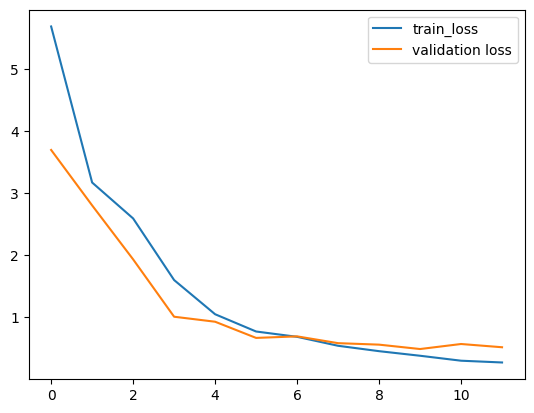

In [38]:
plt.plot(history.history['loss'], label='train_loss')
plt.plot(history.history['val_loss'], label='validation loss')
plt.legend()
plt.show()

The above plot compare the training and validation loss. the blue line indicate the training loss and the orange line indicate the validation loss. Here we can see that the training loss and validation loss is decreasing over the number of epochs. the training loss continues to decrease while the validation loss at the 9th epoch slightly increases and then again decrease over the 10th epoch. here few things to consider is that:
- the training and validation loss is decreasing
-  there is little difference between training and validation loss, indicating that the model doesnot overfit the model
-  training and validation loss of the last epoch is below 1, indicating the model perform well.

In [39]:
def load_image_from_path(img_path):
    img_path = tf.strings.join([img_path], separator='')
    img_path = tf.strings.reduce_join(img_path, separator='')
    img_path = tf.py_function(get_image_data, [img_path], tf.string)
    img = tf.image.decode_jpeg(img_path, channels=3)
    img = tf.image.resize(img, (299, 299))
    img = tf.image.convert_image_dtype(img, tf.float32)
    # img = tf.keras.applications.inception_v3.preprocess_input(img)
    img = tf.keras.applications.resnet.preprocess_input(img)

    return img


def generate_caption(img_path, add_noise=False):
    img = load_image_from_path(img_path)

    if add_noise:
        noise = tf.random.normal(img.shape)*0.1
        img = img + noise
        img = (img - tf.reduce_min(img))/(tf.reduce_max(img) - tf.reduce_min(img))

    img = tf.expand_dims(img, axis=0)
    img_embed = caption_model.cnn_model(img)
    img_encoded = caption_model.encoder(img_embed, training=False)

    y_inp = '[start]'
    for i in range(MAX_LENGTH-1):
        tokenized = tokenizer([y_inp])[:, :-1]
        mask = tf.cast(tokenized != 0, tf.int32)
        pred = caption_model.decoder(
            tokenized, img_encoded, training=False, mask=mask)

        pred_idx = np.argmax(pred[0, i, :])
        pred_idx = tf.convert_to_tensor(pred_idx)
        pred_word = idx2word(pred_idx).numpy().decode('utf-8')
        if pred_word == '[end]':
            break

        y_inp += ' ' + pred_word

    y_inp = y_inp.replace('[start] ', '')
    return y_inp


Comparing the predicted and original caption for random image

Predicted Caption: state visits



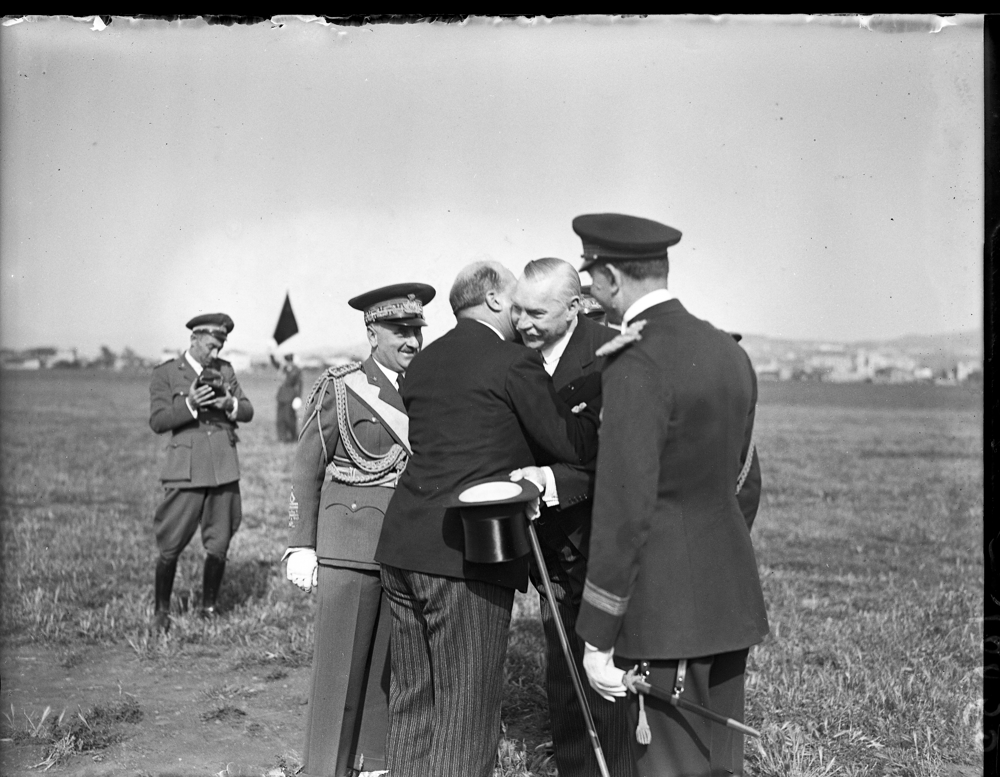

In [40]:
idx = random.randrange(0, len(data))
img_path = data.iloc[idx].media_url

pred_caption = generate_caption(img_path)
print('Predicted Caption:', pred_caption)
print()
response = requests.get(img_path)
img = Image.open(BytesIO(response.content))
img

In [41]:
print("Original Caption: ",data.iloc[idx].eng_tags[8:-6])

Original Caption:  state visits


In [44]:
pred_cap = []
for idx in range(0,len(data)):
  img_path = data.iloc[idx].media_url
  pred_caption = generate_caption(img_path)
  pred_cap.append(pred_caption)

In [ ]:
pred_cap

In [49]:
final_df = data[['media_id','eng_tags']]

In [50]:
final_df['predicted_caption'] = pred_cap

In [59]:
final_df['eng_tags'] = final_df['eng_tags'].apply(lambda x: x.replace('[start] ', '')).apply(lambda x: x.replace(' [end]', ''))

In [ ]:
final_df.to_csv('prediction.csv')